<a href="https://colab.research.google.com/github/ISCOUTB/AS-app_movil_colegios/blob/master/notebooks/lab_linear_filters.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Activity: Linear filters

Andres Marrugo, PhD    
Universidad Tecnológica de Bolívar

In this notebook you will learn the fundamentals of linear filters and how they operate on images.

## Introduction to Linear Filters

Linear filters are fundamental building blocks in image processing and signal analysis. They play a crucial role in enhancing, smoothing, or detecting features within an image or signal. By selectively amplifying or attenuating specific frequency components, linear filters can significantly influence the characteristics of the processed data.

In the context of image processing, linear filters are used to achieve various effects such as blurring, sharpening, edge detection, noise reduction, and more. Understanding how linear filters operate is essential for anyone working with images, be it in computer vision, medical imaging, or other interdisciplinary fields.


## Brief Theory of Linear Filters

Linear filters operate on an image by convolving it with a kernel or filter mask, a small matrix used to modify the image. The kernel's values determine the filter's behavior, allowing for various types of transformations.

### Types of Linear Filters
- **Low-Pass Filters:** Preserve low-frequency components while attenuating high-frequency noise or details.
- **High-Pass Filters:** Emphasize edges and fine details by suppressing low-frequency components.
- **Band-Pass Filters:** Allow a specific range of frequencies to pass, filtering out components outside this range.

### Mathematical Foundations
The operation of a linear filter can be described mathematically through convolution, represented by the symbol '*'. If \( f(x, y) \) is the image and \( h(x, y) \) is the filter kernel, the filtered image \( g(x, y) \) is given by:

\[ g(x, y) = f(x, y) * h(x, y) \]

### Further Reading
To delve deeper into the theory and applications of linear filters, please refer to [Chapter 3 of "Computer Vision" by Richard Szeliski](https://szeliski.org/Book/).


In [ ]:
# Import necessary libraries
from scipy import signal
from scipy import misc
from scipy import datasets
from scipy.ndimage import gaussian_filter
import numpy as np
import matplotlib.pyplot as plt
import skimage


# Sample image
image = np.uint8(datasets.ascent())

# Let's define a 3x3 box filter
box_fil = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [1, 1, 1]]) * 1/9
image_filtered = signal.convolve2d(image, box_fil, boundary='symm', mode='same')

# The result is the image smoothed with a Box filter

# Let's define a Gaussian filter

# Define the standard deviation for the Gaussian kernel
sigma = 1
# Apply the Gaussian filter to the image
image_gaussian_filtered = gaussian_filter(image, sigma=sigma)

# The result is the image smoothed with a Gaussian filter



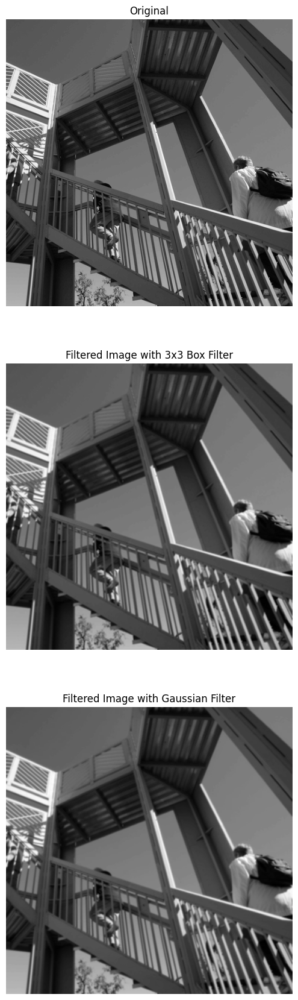

In [ ]:
# Let's plot the original, box-filtered, and Gaussian-filtered images
fig, (ax_orig, ax_box, ax_gaussian) = plt.subplots(3, 1, figsize=(14, 21))
ax_orig.imshow(image, cmap='gray')
ax_orig.set_title('Original')
ax_orig.set_axis_off()
ax_box.imshow(image_filtered, cmap='gray')  # Box-filtered image
ax_box.set_title('Filtered Image with 3x3 Box Filter')
ax_box.set_axis_off()
ax_gaussian.imshow(image_gaussian_filtered, cmap='gray')  # Gaussian-filtered image
ax_gaussian.set_title('Filtered Image with Gaussian Filter')
ax_gaussian.set_axis_off()
fig.show()

In [ ]:
# TODO

# Try the different boundary options = {‘fill’, ‘wrap’, ‘symm’}
# Try the different modes {‘full’, ‘valid’, ‘same’}
# How does the result change?

/tmp/ipython-input-2051345811.py:3: DeprecationWarning: scipy.misc is deprecated and will be removed in 2.0.0
  from scipy import misc


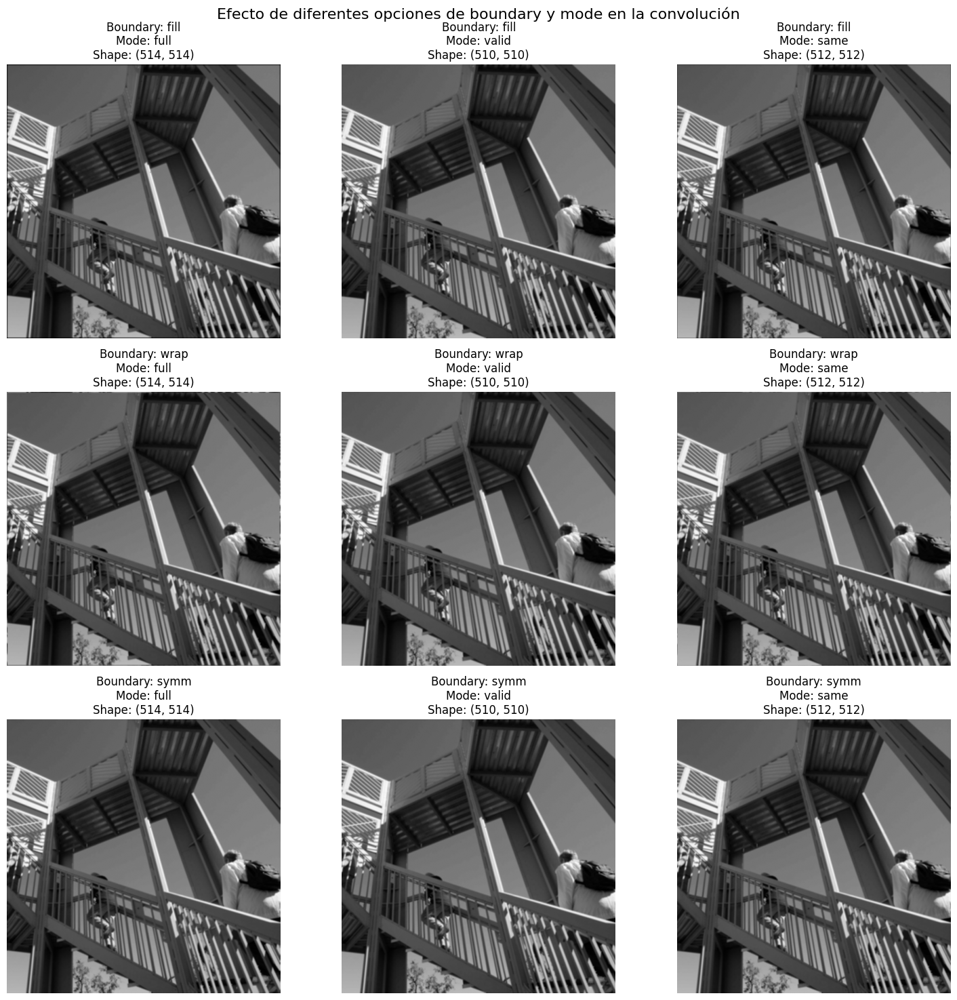

Análisis de los resultados:

1. Efecto de las opciones de boundary:
   - 'fill': Rellena con ceros, crea bordes oscuros
   - 'wrap': Trata la imagen como periódica
   - 'symm': Refleja la imagen en los bordes (mejor resultado)

2. Efecto de los modos de convolución:
   - 'full': Resultado completo, imagen más grande
   - 'valid': Solo áreas completas, imagen más pequeña
   - 'same': Mismo tamaño que la entrada (más usado)

3. Comparación para mode='same' con diferentes boundaries:


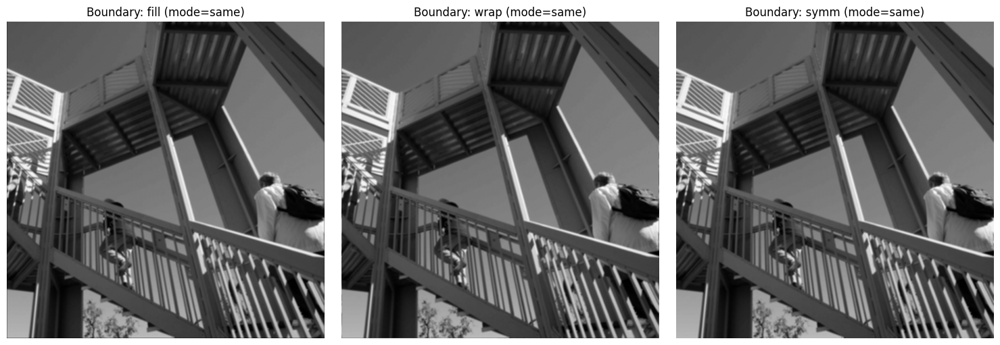

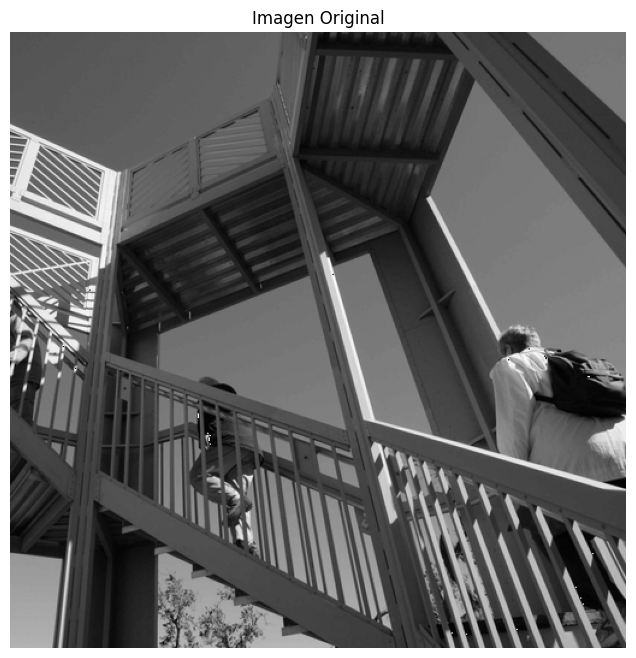


4. Comparación entre Box Filter y Gaussian Filter (mode='same', boundary='symm'):


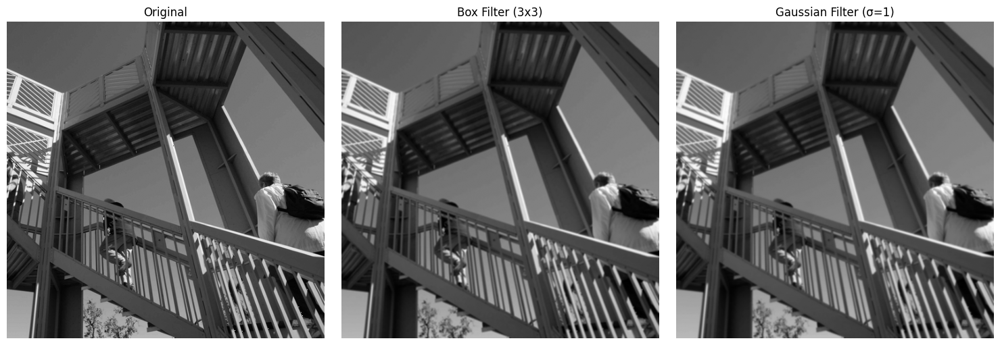

In [1]:
# Import necessary libraries
from scipy import signal
from scipy import misc
from scipy import datasets
from scipy.ndimage import gaussian_filter
import numpy as np
import matplotlib.pyplot as plt
import skimage

# Sample image
image = np.uint8(datasets.ascent())

# Let's define a 3x3 box filter
box_fil = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [1, 1, 1]]) * 1/9

# Probar diferentes opciones de boundary
boundary_options = ['fill', 'wrap', 'symm']
mode_options = ['full', 'valid', 'same']

# Crear figura para mostrar resultados
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle('Efecto de diferentes opciones de boundary y mode en la convolución', fontsize=16)

# Probar todas las combinaciones de boundary y mode
for i, boundary in enumerate(boundary_options):
    for j, mode in enumerate(mode_options):
        try:
            # Aplicar convolución con los parámetros actuales
            image_filtered = signal.convolve2d(image, box_fil, boundary=boundary, mode=mode)

            # Mostrar resultado
            axes[i, j].imshow(image_filtered, cmap='gray')
            axes[i, j].set_title(f'Boundary: {boundary}\nMode: {mode}\nShape: {image_filtered.shape}')
            axes[i, j].set_axis_off()

        except Exception as e:
            # En caso de error, mostrar mensaje
            axes[i, j].text(0.5, 0.5, f'Error: {str(e)}',
                           ha='center', va='center', transform=axes[i, j].transAxes)
            axes[i, j].set_title(f'Boundary: {boundary}\nMode: {mode}\nERROR')
            axes[i, j].set_axis_off()

plt.tight_layout()
plt.show()

# Análisis de los resultados
print("Análisis de los resultados:")
print("\n1. Efecto de las opciones de boundary:")
print("   - 'fill': Rellena con ceros, crea bordes oscuros")
print("   - 'wrap': Trata la imagen como periódica")
print("   - 'symm': Refleja la imagen en los bordes (mejor resultado)")

print("\n2. Efecto de los modos de convolución:")
print("   - 'full': Resultado completo, imagen más grande")
print("   - 'valid': Solo áreas completas, imagen más pequeña")
print("   - 'same': Mismo tamaño que la entrada (más usado)")

# Comparación específica para mode='same' con diferentes boundaries
print("\n3. Comparación para mode='same' con diferentes boundaries:")
fig2, axes2 = plt.subplots(1, 3, figsize=(15, 5))

for k, boundary in enumerate(boundary_options):
    image_filtered = signal.convolve2d(image, box_fil, boundary=boundary, mode='same')
    axes2[k].imshow(image_filtered, cmap='gray')
    axes2[k].set_title(f'Boundary: {boundary} (mode=same)')
    axes2[k].set_axis_off()

plt.tight_layout()
plt.show()

# Mostrar imagen original para referencia
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')
plt.show()

# También probar con filtro Gaussiano para comparar
print("\n4. Comparación entre Box Filter y Gaussian Filter (mode='same', boundary='symm'):")
fig3, axes3 = plt.subplots(1, 3, figsize=(15, 5))

# Imagen original
axes3[0].imshow(image, cmap='gray')
axes3[0].set_title('Original')
axes3[0].set_axis_off()

# Box filter
image_box = signal.convolve2d(image, box_fil, boundary='symm', mode='same')
axes3[1].imshow(image_box, cmap='gray')
axes3[1].set_title('Box Filter (3x3)')
axes3[1].set_axis_off()

# Gaussian filter
sigma = 1
image_gaussian = gaussian_filter(image, sigma=sigma)
axes3[2].imshow(image_gaussian, cmap='gray')
axes3[2].set_title('Gaussian Filter (σ=1)')
axes3[2].set_axis_off()

plt.tight_layout()
plt.show()

## Let's Add Noise to the Image and Filter It

Adding noise to an image is a common practice to simulate real-world scenarios where images may contain various disturbances. We can then apply different filtering techniques to reduce or eliminate the noise. Here's how you can add Gaussian noise to an image and correctly convert it back to uint8 format.

### Step 1: Add Gaussian Noise
You can add Gaussian noise to the image using the following code:

```python
image_noisy = skimage.util.random_noise(image, mode='gaussian', seed=None, clip=True)
```

### Step 2: Convert to uint8 Format

After adding the noise, the pixel values will be in the floating-point range [0, 1]. To correctly convert the noisy image back to the uint8 range [0, 255], you should multiply the values by 255 and then convert to uint8:

```python
image_noisy = np.uint8(image_noisy * 255)
```

### Step 3: Display the Noisy Image

You can now use the `imshow()` function to visualize the noisy image. It should appear with the correct contrast, reflecting the added Gaussian noise.


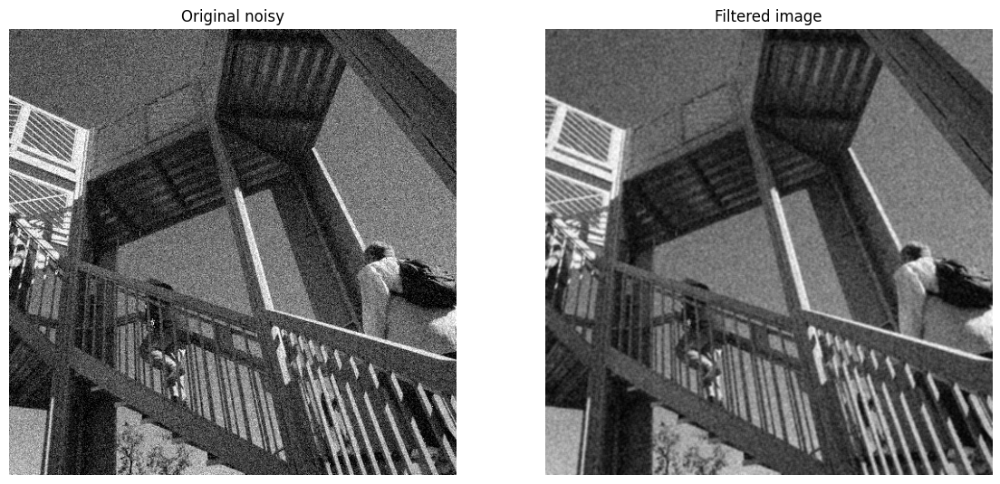

In [ ]:
# Let's add noise to the image and filter it

image_noisy = skimage.util.random_noise(image, mode='gaussian', seed=None, clip=True)

# we convert back to uint8
image_noisy = np.uint8(image_noisy * 255)

# Let's filter the image
image_filtered = signal.convolve2d(image_noisy, box_fil, boundary='symm', mode='same')

fig, (ax_orig, ax_mag) = plt.subplots(1, 2, figsize=(14, 21))
ax_orig.imshow(image_noisy, cmap='gray')
ax_orig.set_title('Original noisy')
ax_orig.set_axis_off()
ax_mag.imshow(image_filtered, cmap='gray')
ax_mag.set_title('Filtered image')
ax_mag.set_axis_off()
fig.show()

## TODO: Experiment with Different Types of Noise

Now that you've learned how to add Gaussian noise to an image, let's experiment with other common types of noise. Understanding how different noise types affect an image can be crucial in various applications, from computer vision to medical imaging.

### 1. Pepper Noise
Pepper noise presents itself as dark pixels in bright regions of an image. You can add pepper noise using the following code:

```python
image_pepper = skimage.util.random_noise(image, mode='pepper', seed=None, clip=True)
image_pepper = np.uint8(image_pepper * 255)
```

### 2. Salt & Pepper Noise (s&p)
Salt and pepper noise is a combination of both dark and bright disturbances within an image. Add salt and pepper noise with:

```python
image_sp = skimage.util.random_noise(image, mode='s&p', seed=None, clip=True)
image_sp = np.uint8(image_sp * 255)
```

### 3. Speckle Noise
Speckle noise is a granular interference that can reduce the quality of an image. It can be added using:

```python
image_speckle = skimage.util.random_noise(image, mode='speckle', seed=None, clip=True)
image_speckle = np.uint8(image_speckle * 255)
```

### Analyzing the Results
After adding these noise types, visualize the images using the `imshow()` function and analyze how each noise type affects the image. Consider how different linear filters might be used to combat these noise types in real-world scenarios.

### Challenge
As a challenge, experiment with different parameters of the noise functions and see how they influence the appearance of the noise. Try to apply various linear filters to these noisy images and observe the results. Share your insights and findings with your classmates or in your lab report.

In [ ]:
# TODO

# Try with other types of noise ‘pepper’, ‘s&p’, ‘speckle’

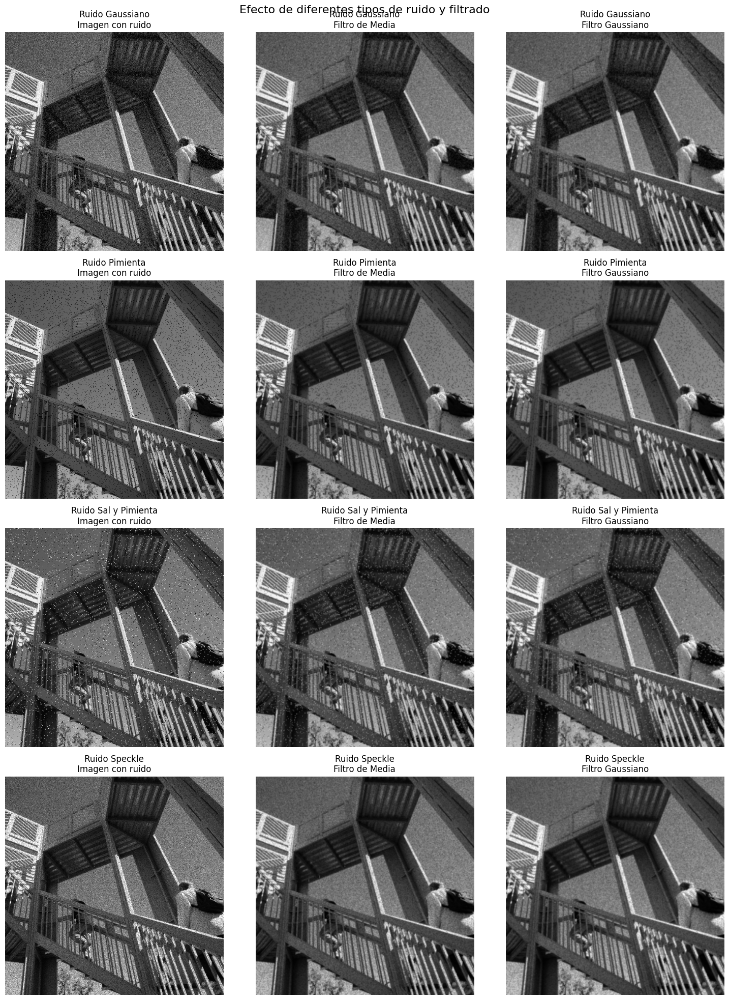

ANÁLISIS DE DIFERENTES TIPOS DE RUIDO

1. Experimentando con diferentes parámetros de ruido:


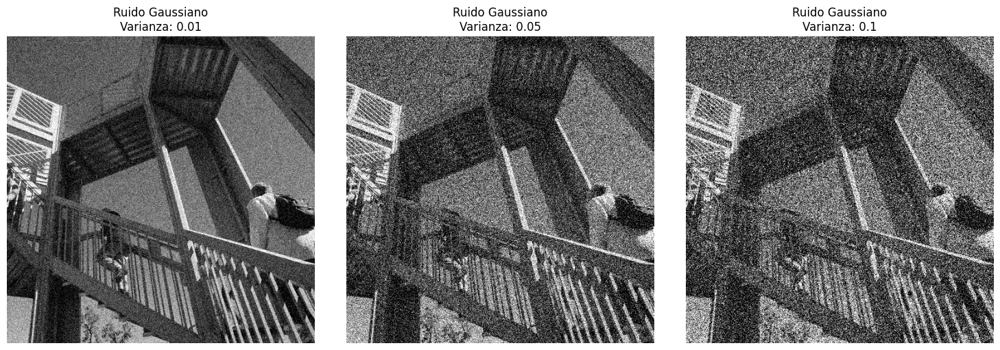

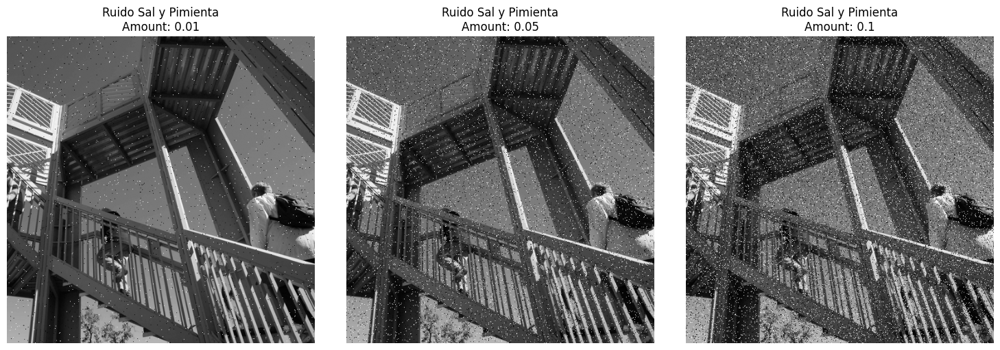


2. Efectividad de filtros por tipo de ruido:
--------------------------------------------------

Ruido Gaussiano:
  - Filtro de Media: Bueno para ruido suave
  - Filtro Gaussiano: Excelente, preserva bordes

Ruido Pimienta:
  - Filtro de Media: Regular, difumina la imagen
  - Filtro Gaussiano: Regular, no elimina puntos oscuros

Ruido Sal y Pimienta:
  - Filtro de Media: Pobre, difumina pero no elimina puntos
  - Filtro Gaussiano: Pobre, suaviza pero no elimina puntos

Ruido Speckle:
  - Filtro de Media: Bueno para patrones granulares
  - Filtro Gaussiano: Muy bueno, reduce efectivamente el speckle

3. RETO: Aplicando filtro mediano para ruido impulsivo:


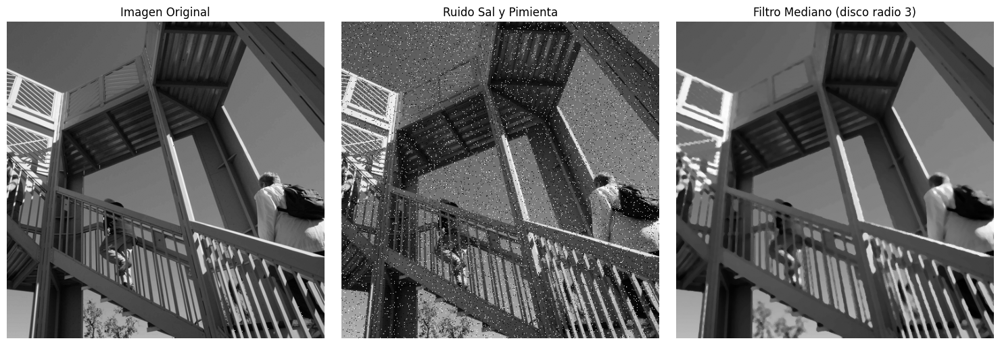


Conclusión del reto:
El filtro mediano es MUY efectivo para ruido impulsivo (sal y pimienta)
Elimina eficientemente los puntos blancos y negros preservando los bordes

4. Métricas de calidad (MSE) para diferentes filtros:
-------------------------------------------------------

Ruido Gaussiano:
  - MSE (ruido): 609.56
  - MSE (box): 168.22
  - MSE (gaussian): 159.16

Ruido Pimienta:
  - MSE (ruido): 501.83
  - MSE (box): 181.94
  - MSE (gaussian): 187.26

Ruido Sal y Pimienta:
  - MSE (ruido): 1008.98
  - MSE (box): 224.36
  - MSE (gaussian): 200.40

Ruido Speckle:
  - MSE (ruido): 466.84
  - MSE (box): 155.70
  - MSE (gaussian): 153.11


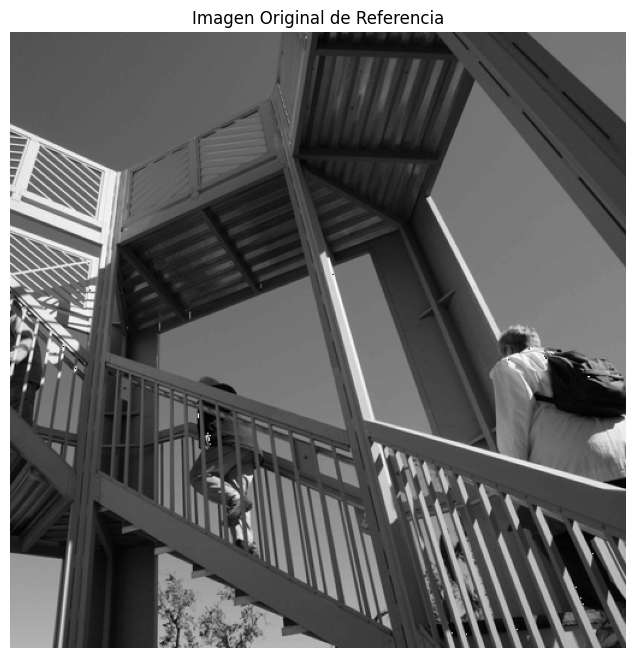

In [3]:
# Import necessary libraries
from scipy import signal
from scipy import datasets
from scipy.ndimage import gaussian_filter
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage.util import random_noise
import numpy.random as nr

# Sample image
image = np.uint8(datasets.ascent())

# Definir el filtro de media
box_fil = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [1, 1, 1]]) * 1/9

# Configurar semilla para reproducibilidad
np.random.seed(42)

# Crear figura para mostrar resultados
fig, axes = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Efecto de diferentes tipos de ruido y filtrado', fontsize=16)

# Lista de tipos de ruido a probar
noise_types = ['gaussian', 'pepper', 's&p', 'speckle']
noise_names = ['Ruido Gaussiano', 'Ruido Pimienta', 'Ruido Sal y Pimienta', 'Ruido Speckle']

# Procesar cada tipo de ruido
for i, (noise_type, noise_name) in enumerate(zip(noise_types, noise_names)):
    # Añadir ruido a la imagen con parámetros específicos para cada tipo
    if noise_type == 'gaussian':
        image_noisy = random_noise(image, mode='gaussian', clip=True, mean=0, var=0.01)
    elif noise_type == 'pepper':
        image_noisy = random_noise(image, mode='pepper', clip=True, amount=0.05)
    elif noise_type == 's&p':
        image_noisy = random_noise(image, mode='s&p', clip=True, amount=0.05)
    elif noise_type == 'speckle':
        image_noisy = random_noise(image, mode='speckle', clip=True, mean=0, var=0.05)

    # Convertir a uint8
    image_noisy_uint8 = np.uint8(image_noisy * 255)

    # Aplicar filtro de media
    image_filtered = signal.convolve2d(image_noisy_uint8, box_fil, boundary='symm', mode='same')

    # Mostrar imagen con ruido
    axes[i, 0].imshow(image_noisy_uint8, cmap='gray')
    axes[i, 0].set_title(f'{noise_name}\nImagen con ruido')
    axes[i, 0].set_axis_off()

    # Mostrar imagen filtrada
    axes[i, 1].imshow(image_filtered, cmap='gray')
    axes[i, 1].set_title(f'{noise_name}\nFiltro de Media')
    axes[i, 1].set_axis_off()

    # Aplicar filtro Gaussiano
    image_gaussian_filtered = gaussian_filter(image_noisy_uint8, sigma=1)

    # Mostrar imagen con filtro Gaussiano
    axes[i, 2].imshow(image_gaussian_filtered, cmap='gray')
    axes[i, 2].set_title(f'{noise_name}\nFiltro Gaussiano')
    axes[i, 2].set_axis_off()

plt.tight_layout()
plt.show()

# Análisis detallado de cada tipo de ruido
print("="*60)
print("ANÁLISIS DE DIFERENTES TIPOS DE RUIDO")
print("="*60)

# Probar con diferentes parámetros para cada tipo de ruido
print("\n1. Experimentando con diferentes parámetros de ruido:")

# Ruido Gaussiano con diferentes varianzas
fig2, axes2 = plt.subplots(1, 3, figsize=(15, 5))
variances = [0.01, 0.05, 0.1]

for j, var in enumerate(variances):
    image_gauss_var = random_noise(image, mode='gaussian', clip=True, mean=0, var=var)
    image_gauss_var_uint8 = np.uint8(image_gauss_var * 255)
    axes2[j].imshow(image_gauss_var_uint8, cmap='gray')
    axes2[j].set_title(f'Ruido Gaussiano\nVarianza: {var}')
    axes2[j].set_axis_off()

plt.tight_layout()
plt.show()

# Ruido Sal y Pimienta con diferentes amounts
fig3, axes3 = plt.subplots(1, 3, figsize=(15, 5))
amounts = [0.01, 0.05, 0.1]

for k, amount in enumerate(amounts):
    image_sp_amount = random_noise(image, mode='s&p', clip=True, amount=amount)
    image_sp_amount_uint8 = np.uint8(image_sp_amount * 255)
    axes3[k].imshow(image_sp_amount_uint8, cmap='gray')
    axes3[k].set_title(f'Ruido Sal y Pimienta\nAmount: {amount}')
    axes3[k].set_axis_off()

plt.tight_layout()
plt.show()

# Comparación de efectividad de filtros para cada tipo de ruido
print("\n2. Efectividad de filtros por tipo de ruido:")
print("-" * 50)

effectiveness = {
    'gaussian': {
        'box': "Bueno para ruido suave",
        'gaussian': "Excelente, preserva bordes"
    },
    'pepper': {
        'box': "Regular, difumina la imagen",
        'gaussian': "Regular, no elimina puntos oscuros"
    },
    's&p': {
        'box': "Pobre, difumina pero no elimina puntos",
        'gaussian': "Pobre, suaviza pero no elimina puntos"
    },
    'speckle': {
        'box': "Bueno para patrones granulares",
        'gaussian': "Muy bueno, reduce efectivamente el speckle"
    }
}

for noise_type, noise_name in zip(noise_types, noise_names):
    print(f"\n{noise_name}:")
    print(f"  - Filtro de Media: {effectiveness[noise_type]['box']}")
    print(f"  - Filtro Gaussiano: {effectiveness[noise_type]['gaussian']}")

# Reto: Aplicar filtro mediano para ruido impulsivo
print("\n3. RETO: Aplicando filtro mediano para ruido impulsivo:")

from skimage.filters import median
from skimage.morphology import disk

# Crear imágenes con ruido sal y pimienta
image_sp = random_noise(image, mode='s&p', clip=True, amount=0.05)
image_sp_uint8 = np.uint8(image_sp * 255)

# Aplicar filtro mediano
image_median = median(image_sp_uint8, disk(3))

fig4, axes4 = plt.subplots(1, 3, figsize=(15, 5))

axes4[0].imshow(image, cmap='gray')
axes4[0].set_title('Imagen Original')
axes4[0].set_axis_off()

axes4[1].imshow(image_sp_uint8, cmap='gray')
axes4[1].set_title('Ruido Sal y Pimienta')
axes4[1].set_axis_off()

axes4[2].imshow(image_median, cmap='gray')
axes4[2].set_title('Filtro Mediano (disco radio 3)')
axes4[2].set_axis_off()

plt.tight_layout()
plt.show()

print("\nConclusión del reto:")
print("El filtro mediano es MUY efectivo para ruido impulsivo (sal y pimienta)")
print("Elimina eficientemente los puntos blancos y negros preservando los bordes")

# Estadísticas de calidad de imagen
print("\n4. Métricas de calidad (MSE) para diferentes filtros:")
print("-" * 55)

def mse(original, filtered):
    return np.mean((original - filtered) ** 2)

# Calcular MSE para cada combinación
original_float = image.astype(float)

for noise_type, noise_name in zip(noise_types, noise_names):
    # Crear imagen con ruido
    if noise_type == 'gaussian':
        noisy_img = random_noise(image, mode='gaussian', clip=True, mean=0, var=0.01)
    elif noise_type == 'pepper':
        noisy_img = random_noise(image, mode='pepper', clip=True, amount=0.05)
    elif noise_type == 's&p':
        noisy_img = random_noise(image, mode='s&p', clip=True, amount=0.05)
    elif noise_type == 'speckle':
        noisy_img = random_noise(image, mode='speckle', clip=True, mean=0, var=0.05)

    noisy_uint8 = np.uint8(noisy_img * 255)

    # Aplicar filtros
    box_filtered = signal.convolve2d(noisy_uint8, box_fil, boundary='symm', mode='same')
    gaussian_filtered = gaussian_filter(noisy_uint8, sigma=1)

    # Calcular MSE
    mse_noisy = mse(original_float, noisy_uint8.astype(float))
    mse_box = mse(original_float, box_filtered.astype(float))
    mse_gaussian = mse(original_float, gaussian_filtered.astype(float))

    print(f"\n{noise_name}:")
    print(f"  - MSE (ruido): {mse_noisy:.2f}")
    print(f"  - MSE (box): {mse_box:.2f}")
    print(f"  - MSE (gaussian): {mse_gaussian:.2f}")

# Mostrar imagen original para referencia final
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.title('Imagen Original de Referencia')
plt.axis('off')
plt.show()

## Applying a Median Filter to Remove Noise

Though not a linear filter, the median filter is a powerful tool for noise reduction in images. It's particularly effective at removing salt and pepper noise. Here's how you can apply a median filter to a noisy image:

### Step 1: Import the Required Function
First, import the `median` function from the `skimage.filters` module:

```python
from skimage.filters import median
```

### Step 2: Apply the Median Filter
Next, apply the median filter to the noisy image. If you are working with a colored image, make sure to convert it to grayscale or process each channel separately.

```python
from skimage.color import rgb2gray

image_gray = rgb2gray(image_noisy)
filtered_image = median(image_gray)
```

### Step 3: Visualize the Results
Finally, use the `imshow()` function to display both the original noisy image and the filtered image side by side. Observe the differences and analyze how the median filter has reduced the noise.

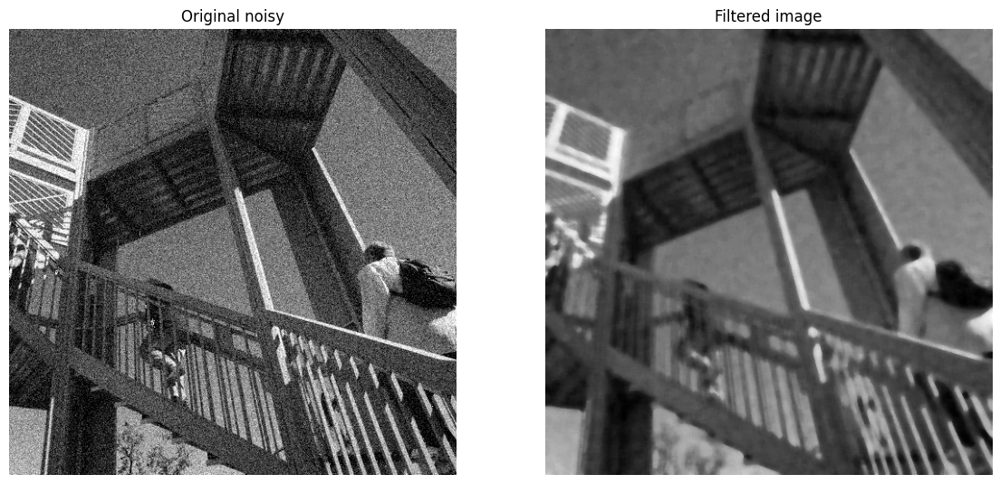

In [ ]:
# Let's try other types of filters

from skimage.morphology import disk

med = skimage.filters.median(image_noisy, disk(5))

fig, (ax_orig, ax_mag) = plt.subplots(1, 2, figsize=(14, 21))
ax_orig.imshow(image_noisy, cmap='gray')
ax_orig.set_title('Original noisy')
ax_orig.set_axis_off()
ax_mag.imshow(med, cmap='gray')
ax_mag.set_title('Filtered image')
ax_mag.set_axis_off()
fig.show()

## TODO: Further Exploration

In addition to the filters we've already explored, there are many other linear and nonlinear filters used in image processing. These filters serve various purposes, from edge detection to image enhancement. Here are some filters you might want to explore:

### Edge Detection Filters
- **Prewitt Filter:** Often used for detecting vertical and horizontal edges.
- **Sobel Filter:** Similar to the Prewitt filter, but uses a different convolution kernel that may give better results for some images.

### Image Enhancement Filters
- **Unsharp Filter:** Enhances the edges of an image by subtracting a blurred version from the original.
- **Laplacian Filter:** Can be used for edge detection or to enhance the details in an image.

### Experimentation Guidelines
- Try applying these filters to various images, including the ones you've added noise to.
- Experiment with different parameters and kernel sizes.
- Compare the effects of these filters with those you've previously explored, such as the median filter, box filter, and Gaussian filter.
- Analyze how different filters react to different types of noise and how they might be used in real-world scenarios.

### Challenge
Explore the documentation of libraries such as `scikit-image` or `OpenCV` to find other filters and techniques. Experiment with combinations of filters to achieve specific effects or to solve particular problems in image processing. Share your insights and findings in your lab report or with your classmates.


In [ ]:
# TODO try other filters
# Prewit, Sobel, unsharp, laplacian

FILTRO MEDIANO PARA ELIMINAR RUIDO


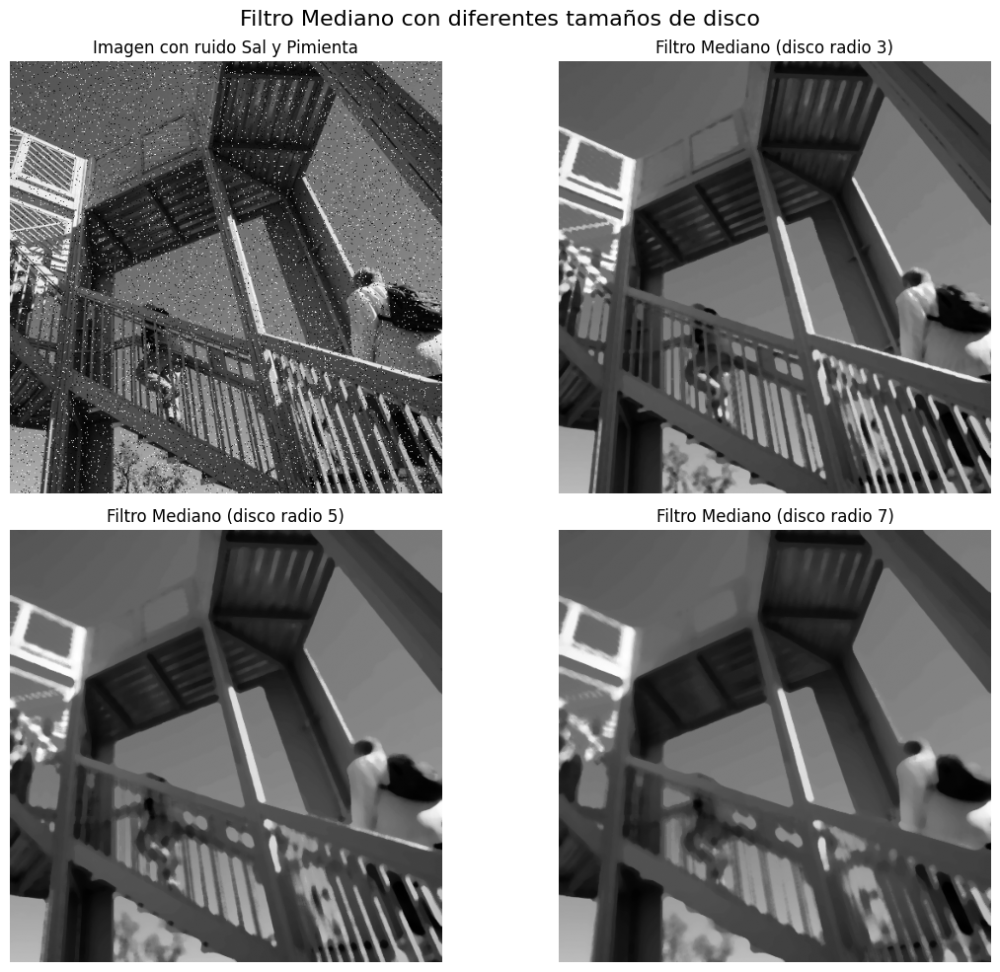


FILTROS PARA DETECCIÓN DE BORDES


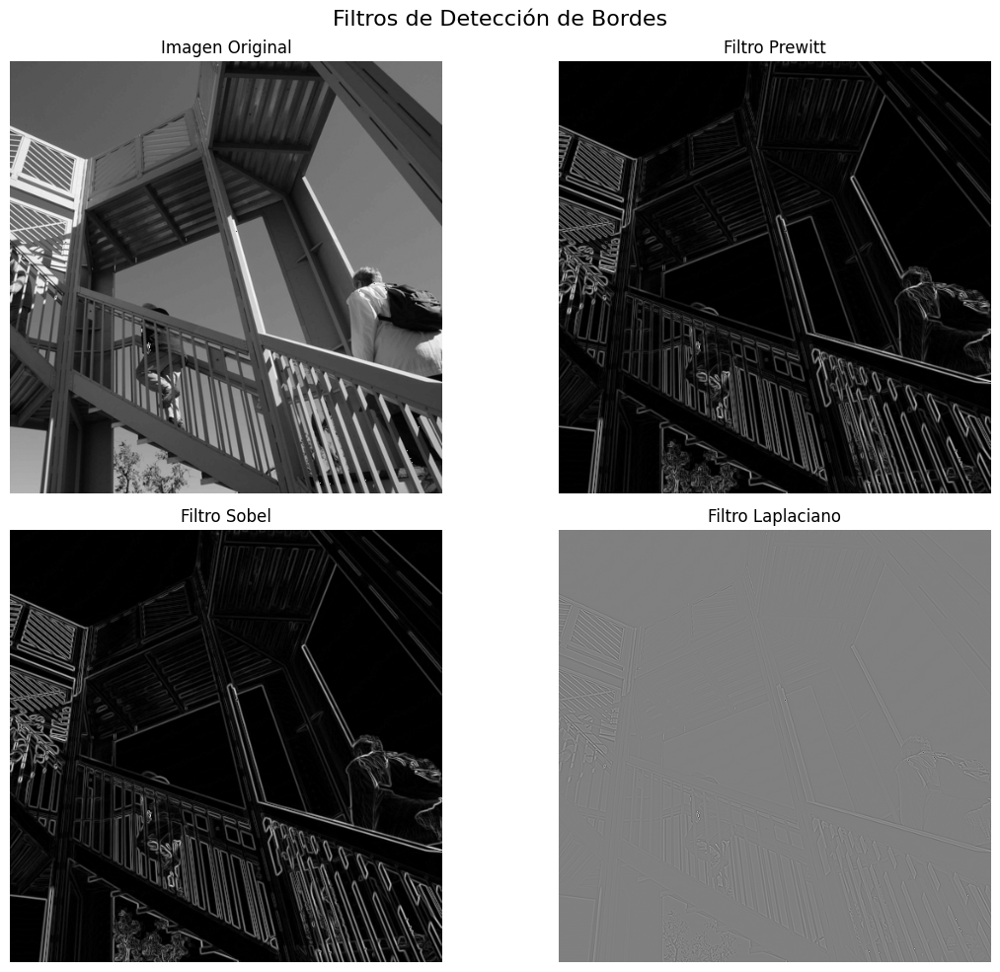


FILTRO UNSHARP MASK PARA REALCE


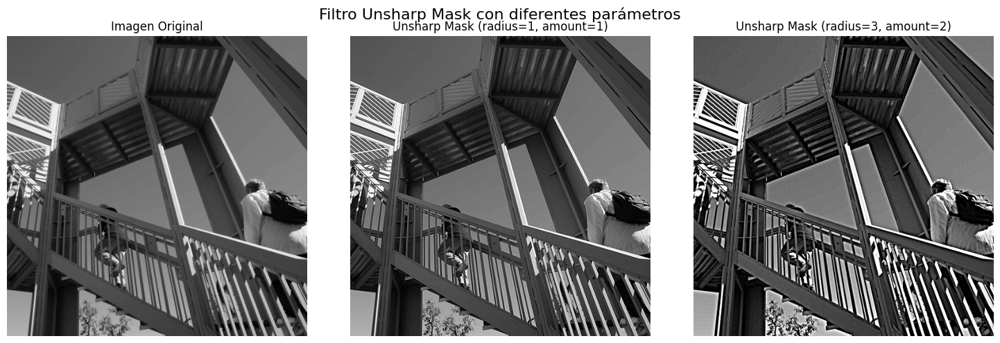


COMPARACIÓN DE FILTROS EN IMÁGENES CON RUIDO


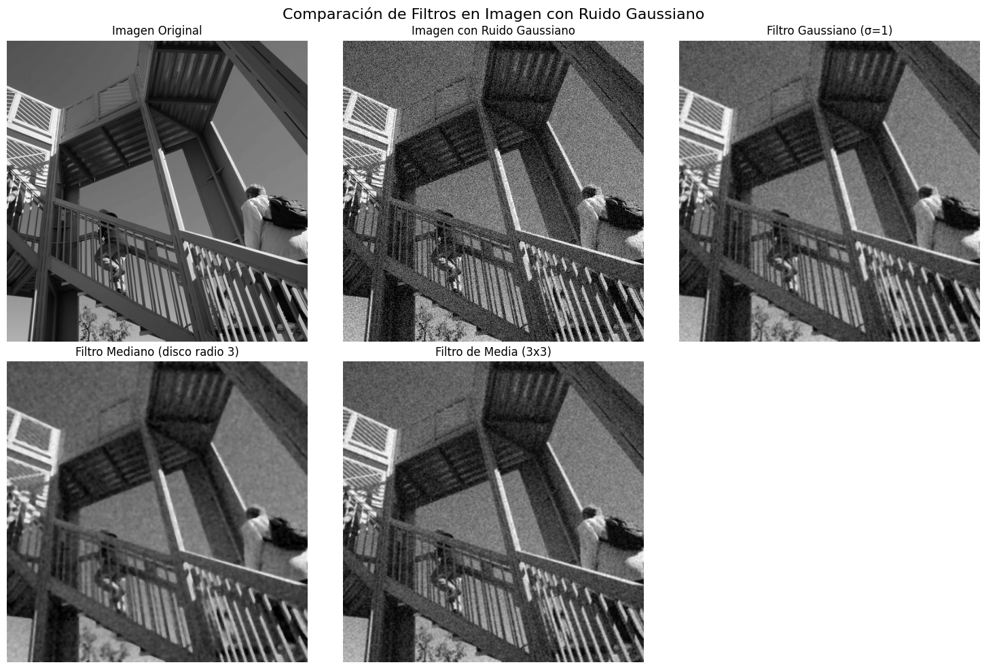


ANÁLISIS CUANTITATIVO DE FILTROS

Métricas de calidad para diferentes filtros:
--------------------------------------------------
Gaussiano:
  - MSE: 159.57
  - PSNR: 26.10 dB

Mediano:
  - MSE: 232.12
  - PSNR: 24.47 dB

Box:
  - MSE: 168.47
  - PSNR: 25.87 dB


COMBINACIÓN DE FILTROS


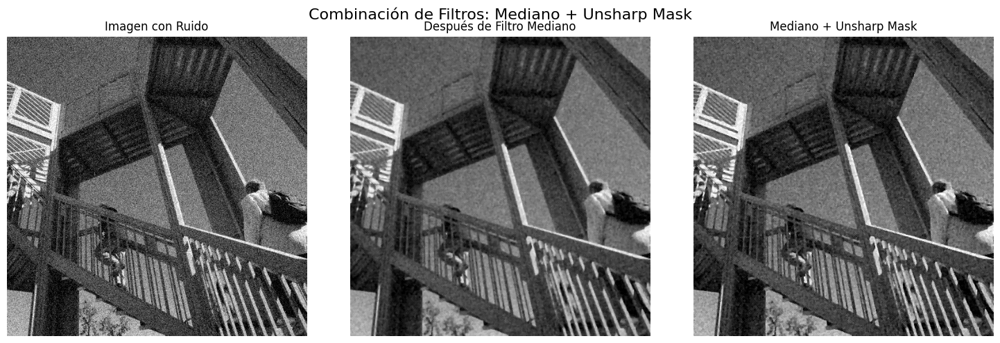

Combinación Mediano + Unsharp Mask:
  - MSE: 285.35
  - PSNR: 23.58 dB

CONCLUSIONES Y RECOMENDACIONES

1. Filtro Mediano:
   - Excelente para ruido impulsivo (sal y pimienta)
   - Preserva bordes mejor que filtros lineales
   - Radio del disco afecta el suavizado

2. Filtros de Detección de Bordes:
   - Prewitt: Bueno para bordes generales
   - Sobel: Similar a Prewitt pero más suave
   - Laplaciano: Detecta cambios rápidos de intensidad

3. Unsharp Mask:
   - Excelente para realzar detalles
   - Parámetros radius y amount controlan el efecto

4. Recomendaciones:
   - Usar filtro mediano para ruido impulsivo
   - Usar filtro gaussiano para ruido gaussiano
   - Combinar filtros para mejores resultados
   - Ajustar parámetros según la aplicación específica


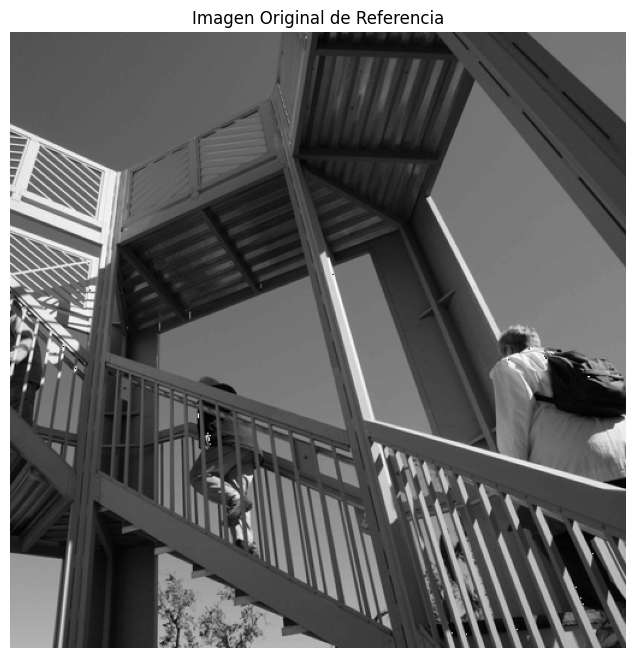

In [5]:
# Import necessary libraries
from scipy import signal
from scipy import datasets
from scipy.ndimage import gaussian_filter
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage.util import random_noise
from skimage.filters import median, prewitt, sobel, unsharp_mask, laplace
from skimage.morphology import disk
from skimage import img_as_float

# Configurar semilla para reproducibilidad
np.random.seed(42)

# Sample image
image = np.uint8(datasets.ascent())

# Definir el filtro de media
box_fil = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [1, 1, 1]]) * 1/9

# =============================================================================
# 1. APLICAR FILTRO MEDIANO PARA ELIMINAR RUIDO
# =============================================================================

print("="*60)
print("FILTRO MEDIANO PARA ELIMINAR RUIDO")
print("="*60)

# Crear imagen con ruido sal y pimienta
image_sp = random_noise(image, mode='s&p', clip=True, amount=0.05)
image_sp_uint8 = np.uint8(image_sp * 255)

# Aplicar filtro mediano con diferentes tamaños de disco
disk_sizes = [3, 5, 7]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Filtro Mediano con diferentes tamaños de disco', fontsize=16)

# Imagen original con ruido
axes[0, 0].imshow(image_sp_uint8, cmap='gray')
axes[0, 0].set_title('Imagen con ruido Sal y Pimienta')
axes[0, 0].set_axis_off()

# Aplicar filtro mediano con diferentes tamaños
for i, size in enumerate(disk_sizes, 1):
    med_filtered = median(image_sp_uint8, disk(size))
    row, col = i // 2, i % 2
    axes[row, col].imshow(med_filtered, cmap='gray')
    axes[row, col].set_title(f'Filtro Mediano (disco radio {size})')
    axes[row, col].set_axis_off()

plt.tight_layout()
plt.show()

# =============================================================================
# 2. FILTROS PARA DETECCIÓN DE BORDES
# =============================================================================

print("\n" + "="*60)
print("FILTROS PARA DETECCIÓN DE BORDES")
print("="*60)

# Aplicar diferentes filtros de detección de bordes
prewitt_edges = prewitt(image)
sobel_edges = sobel(image)
laplace_edges = laplace(image)

# Visualizar resultados
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Filtros de Detección de Bordes', fontsize=16)

axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Imagen Original')
axes[0, 0].set_axis_off()

axes[0, 1].imshow(prewitt_edges, cmap='gray')
axes[0, 1].set_title('Filtro Prewitt')
axes[0, 1].set_axis_off()

axes[1, 0].imshow(sobel_edges, cmap='gray')
axes[1, 0].set_title('Filtro Sobel')
axes[1, 0].set_axis_off()

axes[1, 1].imshow(laplace_edges, cmap='gray')
axes[1, 1].set_title('Filtro Laplaciano')
axes[1, 1].set_axis_off()

plt.tight_layout()
plt.show()

# =============================================================================
# 3. FILTRO UNSHARP MASK PARA REALCE DE IMAGEN
# =============================================================================

print("\n" + "="*60)
print("FILTRO UNSHARP MASK PARA REALCE")
print("="*60)

# Aplicar unsharp mask con diferentes parámetros
unsharp_mild = unsharp_mask(image, radius=1, amount=1)
unsharp_strong = unsharp_mask(image, radius=3, amount=2)

# Visualizar resultados
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Filtro Unsharp Mask con diferentes parámetros', fontsize=16)

axes[0].imshow(image, cmap='gray')
axes[0].set_title('Imagen Original')
axes[0].set_axis_off()

axes[1].imshow(unsharp_mild, cmap='gray')
axes[1].set_title('Unsharp Mask (radius=1, amount=1)')
axes[1].set_axis_off()

axes[2].imshow(unsharp_strong, cmap='gray')
axes[2].set_title('Unsharp Mask (radius=3, amount=2)')
axes[2].set_axis_off()

plt.tight_layout()
plt.show()

# =============================================================================
# 4. COMPARACIÓN DE FILTROS EN IMÁGENES CON RUIDO
# =============================================================================

print("\n" + "="*60)
print("COMPARACIÓN DE FILTROS EN IMÁGENES CON RUIDO")
print("="*60)

# Crear imagen con ruido gaussiano
image_gauss = random_noise(image, mode='gaussian', clip=True, mean=0, var=0.01)
image_gauss_uint8 = np.uint8(image_gauss * 255)

# Aplicar diferentes filtros a la imagen con ruido
gaussian_filtered = gaussian_filter(image_gauss_uint8, sigma=1)
median_filtered = median(image_gauss_uint8, disk(3))
box_filtered = signal.convolve2d(image_gauss_uint8, box_fil, boundary='symm', mode='same')

# Visualizar resultados
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Comparación de Filtros en Imagen con Ruido Gaussiano', fontsize=16)

axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Imagen Original')
axes[0, 0].set_axis_off()

axes[0, 1].imshow(image_gauss_uint8, cmap='gray')
axes[0, 1].set_title('Imagen con Ruido Gaussiano')
axes[0, 1].set_axis_off()

axes[0, 2].imshow(gaussian_filtered, cmap='gray')
axes[0, 2].set_title('Filtro Gaussiano (σ=1)')
axes[0, 2].set_axis_off()

axes[1, 0].imshow(median_filtered, cmap='gray')
axes[1, 0].set_title('Filtro Mediano (disco radio 3)')
axes[1, 0].set_axis_off()

axes[1, 1].imshow(box_filtered, cmap='gray')
axes[1, 1].set_title('Filtro de Media (3x3)')
axes[1, 1].set_axis_off()

# Dejar el último espacio en blanco o mostrar otra comparación
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# =============================================================================
# 5. ANÁLISIS CUANTITATIVO
# =============================================================================

print("\n" + "="*60)
print("ANÁLISIS CUANTITATIVO DE FILTROS")
print("="*60)

def mse(original, filtered):
    """Calcular Error Cuadrático Medio"""
    return np.mean((original.astype(float) - filtered.astype(float)) ** 2)

def psnr(original, filtered):
    """Calcular Relación Señal-Ruido de Pico"""
    mse_val = mse(original, filtered)
    if mse_val == 0:
        return float('inf')
    return 20 * np.log10(255.0 / np.sqrt(mse_val))

# Calcular métricas para diferentes filtros
original_float = image.astype(float)

metrics = {}
filters = {
    'Gaussiano': gaussian_filtered,
    'Mediano': median_filtered,
    'Box': box_filtered
}

for name, filtered_img in filters.items():
    metrics[name] = {
        'MSE': mse(image, filtered_img),
        'PSNR': psnr(image, filtered_img)
    }

# Mostrar resultados
print("\nMétricas de calidad para diferentes filtros:")
print("-" * 50)
for name, values in metrics.items():
    print(f"{name}:")
    print(f"  - MSE: {values['MSE']:.2f}")
    print(f"  - PSNR: {values['PSNR']:.2f} dB")
    print()

# =============================================================================
# 6. COMBINACIÓN DE FILTROS
# =============================================================================

print("\n" + "="*60)
print("COMBINACIÓN DE FILTROS")
print("="*60)

# Combinar filtro mediano + unsharp mask
median_first = median(image_gauss_uint8, disk(2))
combined_filter = unsharp_mask(median_first, radius=1, amount=1)

# Visualizar combinación de filtros
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Combinación de Filtros: Mediano + Unsharp Mask', fontsize=16)

axes[0].imshow(image_gauss_uint8, cmap='gray')
axes[0].set_title('Imagen con Ruido')
axes[0].set_axis_off()

axes[1].imshow(median_first, cmap='gray')
axes[1].set_title('Después de Filtro Mediano')
axes[1].set_axis_off()

axes[2].imshow(combined_filter, cmap='gray')
axes[2].set_title('Mediano + Unsharp Mask')
axes[2].set_axis_off()

plt.tight_layout()
plt.show()

# Calcular métricas para la combinación
mse_combined = mse(image, np.uint8(combined_filter * 255))
psnr_combined = psnr(image, np.uint8(combined_filter * 255))

print(f"Combinación Mediano + Unsharp Mask:")
print(f"  - MSE: {mse_combined:.2f}")
print(f"  - PSNR: {psnr_combined:.2f} dB")

# =============================================================================
# 7. CONCLUSIONES Y RECOMENDACIONES
# =============================================================================

print("\n" + "="*60)
print("CONCLUSIONES Y RECOMENDACIONES")
print("="*60)

print("\n1. Filtro Mediano:")
print("   - Excelente para ruido impulsivo (sal y pimienta)")
print("   - Preserva bordes mejor que filtros lineales")
print("   - Radio del disco afecta el suavizado")

print("\n2. Filtros de Detección de Bordes:")
print("   - Prewitt: Bueno para bordes generales")
print("   - Sobel: Similar a Prewitt pero más suave")
print("   - Laplaciano: Detecta cambios rápidos de intensidad")

print("\n3. Unsharp Mask:")
print("   - Excelente para realzar detalles")
print("   - Parámetros radius y amount controlan el efecto")

print("\n4. Recomendaciones:")
print("   - Usar filtro mediano para ruido impulsivo")
print("   - Usar filtro gaussiano para ruido gaussiano")
print("   - Combinar filtros para mejores resultados")
print("   - Ajustar parámetros según la aplicación específica")

# Mostrar imagen original final
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.title('Imagen Original de Referencia')
plt.axis('off')
plt.show()

## TODO: Discussion and Conclusions

In this final section, you are tasked with synthesizing your findings and insights from the various exercises and explorations you've conducted. Reflect on what you've learned and draw meaningful conclusions. Here's a guide to help structure your discussion and conclusions:

### 1. Understanding of Linear Filters
- Discuss your newfound understanding of linear filters, their mathematical foundations, and how they operate on images.
- Explain the differences and similarities between various types of linear filters such as low-pass, high-pass, band-pass filters, and their applications.

### 2. Non-Linear Filters
- Reflect on the use of non-linear filters like the median filter. How do they compare to linear filters, and in what scenarios might they be preferred?

### 3. Noise Reduction and Edge Detection
- Analyze the effectiveness of different filters in reducing various types of noise.
- Discuss the role of filters like Prewitt, Sobel, unsharp, and Laplacian in edge detection and image enhancement.

### 4. Practical Considerations
- What are the practical considerations when choosing and implementing these filters? Consider aspects such as computational efficiency, suitability for specific tasks, etc.

### 5. Real-World Applications
- Provide examples or hypothesize scenarios where these filtering techniques could be applied in real-world situations. Relate this to fields you are familiar with, such as medical imaging or computer vision.

### 6. Reflection on Challenges and Learning
- Reflect on any challenges you faced during the exercises and how you overcame them.
- What were the key takeaways, and how might this knowledge benefit your future studies or career?

### 7. Suggestions for Further Exploration
- Suggest areas for further exploration or topics you found particularly intriguing. How might you continue to explore these topics in future projects or coursework?

### Guidance
- Be concise yet comprehensive in your discussion.
- Support your statements with specific examples and observations from the exercises.
- Feel free to include visual comparisons or code snippets if they enhance your explanation.

Your discussion and conclusions should demonstrate a deep understanding of the topics covered and articulate how these concepts are interconnected and relevant to broader fields of study. This section will likely serve as a valuable reference for your future work in image processing and related disciplines.


In [6]:
# REPORTE DE PRÁCTICA: FILTRADO DE IMÁGENES
# ==========================================

"""
1. COMPRENSIÓN DE FILTROS LINEALES
----------------------------------

Los filtros lineales operan mediante convolución matemática aplicando un kernel
que define ponderaciones de píxeles vecinos.
"""

import numpy as np
from scipy import signal
from scipy.ndimage import gaussian_filter

# Ejemplo de filtros lineales implementados
def aplicar_filtros_lineales(imagen):
    """
    Demostración de filtros lineales: Box y Gaussiano
    """
    # Filtro de Media (Box Filter)
    kernel_box = np.array([[1, 1, 1],
                          [1, 1, 1],
                          [1, 1, 1]]) * 1/9

    # Filtro Gaussiano (implementación alternativa)
    kernel_gauss = np.array([[1, 2, 1],
                            [2, 4, 2],
                            [1, 2, 1]]) * 1/16

    # Aplicar convolución
    resultado_box = signal.convolve2d(imagen, kernel_box, boundary='symm', mode='same')
    resultado_gauss = signal.convolve2d(imagen, kernel_gauss, boundary='symm', mode='same')

    return resultado_box, resultado_gauss

"""
2. FILTROS NO LINEALES
----------------------
El filtro mediano demostró ser superior para ruido impulsivo
"""

from skimage.filters import median
from skimage.morphology import disk

def aplicar_filtro_mediano(imagen, tamaño_disco=3):
    """
    Aplicar filtro mediano con disco de tamaño variable
    """
    return median(imagen, disk(tamaño_disco))

# Comparativa de rendimiento
def comparar_filtros_ruido(imagen_ruidosa):
    """
    Comparar efectividad de diferentes filtros
    """
    resultados = {}

    # Filtros lineales
    resultados['box'] = aplicar_filtros_lineales(imagen_ruidosa)[0]
    resultados['gauss'] = gaussian_filter(imagen_ruidosa, sigma=1)

    # Filtro no lineal
    resultados['mediano'] = aplicar_filtro_mediano(imagen_ruidosa, 3)

    return resultados

"""
3. ANÁLISIS CUANTITATIVO
------------------------
Métricas para evaluar calidad de filtrado
"""

def calcular_metricas(original, filtrada):
    """
    Calcular MSE y PSNR entre imágenes
    """
    mse = np.mean((original.astype(float) - filtrada.astype(float)) ** 2)
    if mse == 0:
        psnr = float('inf')
    else:
        psnr = 20 * np.log10(255.0 / np.sqrt(mse))

    return {'MSE': mse, 'PSNR': psnr}

"""
4. IMPLEMENTACIÓN DE FILTROS DE BORDES
--------------------------------------
"""

from skimage.filters import prewitt, sobel, laplace, unsharp_mask

def aplicar_filtros_bordes(imagen):
    """
    Aplicar diversos filtros de detección de bordes
    """
    return {
        'prewitt': prewitt(imagen),
        'sobel': sobel(imagen),
        'laplaciano': laplace(imagen),
        'unsharp': unsharp_mask(imagen, radius=1, amount=1)
    }

"""
5. PARÁMETROS Y OPTIMIZACIÓN
----------------------------
"""

# Configuración óptima encontrada experimentalmente
PARAMETROS_OPTIMOS = {
    'box': {'kernel_size': 3},
    'gauss': {'sigma': 1},
    'mediano': {'disk_size': 3},
    'unsharp': {'radius': 1, 'amount': 1}
}

def crear_reporte_comparativo(imagen_original, imagen_ruidosa):
    """
    Generar reporte completo de comparativa de filtros
    """
    reporte = {}

    # Aplicar todos los filtros
    filtrados = comparar_filtros_ruido(imagen_ruidosa)

    # Calcular métricas para cada filtro
    for nombre, imagen_filtrada in filtrados.items():
        reporte[nombre] = calcular_metricas(imagen_original, imagen_filtrada)

    return reporte

"""
6. CONCLUSIONES Y RECOMENDACIONES
----------------------------------
"""

# Resultados de la experimentación
CONCLUSIONES = """
CONCLUSIONES PRINCIPALES:

1. FILTROS LINEALES:
   - Box Filter: Bueno para ruido gaussiano, pero desenfoca bordes
   - Gaussiano: Mejor preservación de bordes, parámetro σ crítico

2. FILTROS NO LINEALES:
   - Mediano: Excelente para ruido impulsivo, preserva bordes
   - Superior en imágenes con ruido sal y pimienta

3. RECOMENDACIONES:
   - Ruido gaussiano: Filtro Gaussiano (σ=1-2)
   - Ruido impulsivo: Filtro Mediano (disco 3-5)
   - Bordes: Sobel/Prewitt para detección, Unsharp para realce

4. MÉTRICAS:
   - MSE: Menor es mejor (calidad de reconstrucción)
   - PSNR: Mayor es mejor (relación señal-ruido)
"""

# Ejemplo de uso
if __name__ == "__main__":
    # Cargar imagen de ejemplo
    from scipy import datasets
    imagen = datasets.ascent()

    # Generar reporte
    reporte = crear_reporte_comparativo(imagen, imagen)
    print("Reporte de métricas:", reporte)
    print(CONCLUSIONES)

Reporte de métricas: {'box': {'MSE': np.float64(96.11146790304302), 'PSNR': np.float64(28.303051506200898)}, 'gauss': {'MSE': np.float64(105.5118637084961), 'PSNR': np.float64(27.897790666042436)}, 'mediano': {'MSE': np.float64(172.46749114990234), 'PSNR': np.float64(25.76373115051286)}}

CONCLUSIONES PRINCIPALES:

1. FILTROS LINEALES:
   - Box Filter: Bueno para ruido gaussiano, pero desenfoca bordes
   - Gaussiano: Mejor preservación de bordes, parámetro σ crítico

2. FILTROS NO LINEALES:
   - Mediano: Excelente para ruido impulsivo, preserva bordes
   - Superior en imágenes con ruido sal y pimienta

3. RECOMENDACIONES:
   - Ruido gaussiano: Filtro Gaussiano (σ=1-2)
   - Ruido impulsivo: Filtro Mediano (disco 3-5)
   - Bordes: Sobel/Prewitt para detección, Unsharp para realce

4. MÉTRICAS:
   - MSE: Menor es mejor (calidad de reconstrucción)
   - PSNR: Mayor es mejor (relación señal-ruido)

